In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.font_manager as font_manager
import os
import bilby
import scipy.interpolate as interpolate
import h5py
import scipy.stats as sst
import utils
from utils import analyze_tools as at

/home/sunny.ng/semiparameos/executables/TOVSolver.py:17: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(False)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal


In [3]:
### Units
gcm3_to_dynecm2=8.9875e20 
MeV_to_gcm3 = 1.7827e12 
dynecm2_to_MeVFermi = 1.6022e33
gcm3_to_fm4 = 3.5178e14
sat_dens = 2.8*(np.power(10.0,14.))
c = bilby.core.utils.speed_of_light
c_cgs = c*(1e2)

### Nucleon mass in grams
mass_of_nucleon = 1/(6.02 * 10**23)
### Nucleon mass in MeV/c2
nucleon_mass_in_MeV = 939
### Conversion factors for Mev,fm to CGS units
gcm3_to_dynecm2=8.9875e20 
MeV_to_gcm3 = 1.7827e12 
dynecm2_to_MeVFermi = 1.6022e33
gcm3_to_fm4 = 3.5178e14

fm_in_cgs = 1e-13
rho_nuc_in_cgs = .16 * mass_of_nucleon / (fm_in_cgs)**3

In [4]:
plt.rcParams.update({
    "text.usetex": True,  # Enable LaTeX
    "font.family": "serif",  # Use serif fonts (Computer Modern is a serif font)
    "font.serif": ["Computer Modern"]})  # Set the Computer Modern font

In [5]:
colors = {"prior":"k", "psr":"#558BD4", "psr+gw":"#FFA335", "joint":"#AD75D9", "metamodel":"#F74B4B", "Nuclear":"#FD7904",
         "Nl3":"#36C71F", "Sly4":"#44ABEA", "nucleon":"#558BD4", "hyperon":"#FFA335", "quark": "#AD75D9", "semiparamcs": "#40E0D0"}
labels = {"nucleon":r"Nucleon Informed", "hyperon":"Hyperon Informed", "quark":"Quark Informed"}

***
## Analyzing different matter candidates for training

In [6]:
### Load all nuclear EoS's in CGS
nuclear_eoss_path = "/home/sunny.ng/semiparameos/eos_table/nuclear_set_PRD109-103029/matter_groups"
matter_groups = os.listdir(nuclear_eoss_path)
nuc_eos_data = {}
for categ in matter_groups:
    sub_eos_list = os.listdir(f"{nuclear_eoss_path}/{categ}")
    stored_eos = {}
    for eos in sub_eos_list:
        eos_name = os.path.splitext(eos)[0]
        try:
            eos_data = pd.read_csv(f"{nuclear_eoss_path}/{categ}/{eos}", header = 1, sep = r"\s+")
        except:
            raise KeyError(f"{eos} not found within directory. Available EoS's are: {sub_eos_list}")

        pressure_cgs = (eos_data["P(MeVfm-3)"] / nucleon_mass_in_MeV * mass_of_nucleon / fm_in_cgs**3)
        edens_cgs = (eos_data["rho(MeVfm-3)"] * MeV_to_gcm3)
        bary_cgs = (eos_data["n(fm-3)"] * mass_of_nucleon/fm_in_cgs**3)
        stored_eos[f"{eos_name}"] = {"pressurec2":pressure_cgs, "energy_densityc2": edens_cgs, "baryon_density":bary_cgs}
    nuc_eos_data[f"{categ}"] = stored_eos

full_eoss_path = "/home/sunny.ng/semiparameos/eos_table/nuclear_set_PRD109-103029/eos_tables/"
nuclear_eoss = os.listdir(full_eoss_path)
tabulated_eos = {}
for eos in nuclear_eoss:
    eos_name = os.path.splitext(eos)[0]
    try:
        eos_data = pd.read_csv(f"{full_eoss_path}/{eos}", header = 1, sep = r"\s+")
    except:
        raise KeyError(f"{eos} not found within directory. Available EoS's are: {nuclear_eoss}")

    pressure_cgs = (eos_data["P(MeVfm-3)"] / nucleon_mass_in_MeV * mass_of_nucleon / fm_in_cgs**3)
    edens_cgs = (eos_data["rho(MeVfm-3)"] * MeV_to_gcm3)
    bary_cgs = (eos_data["n(fm-3)"] * mass_of_nucleon/fm_in_cgs**3)
    tabulated_eos[f"{eos_name}"] = {"pressurec2":pressure_cgs, "energy_densityc2": edens_cgs, "baryon_density":bary_cgs}
nuc_eos_data["all"] = tabulated_eos

In [7]:
nuc_samples = h5py.File("/home/sunny.ng/semiparameos/generated_eoss/MMGP_nucleon.h5","r")
hyp_samples = h5py.File("/home/sunny.ng/semiparameos/generated_eoss/MMGP_hyperon.h5","r")
qu_samples = h5py.File("/home/sunny.ng/semiparameos/generated_eoss/MMGP_quark.h5","r")

# Takes a second to load...
# Assumes that all nuclear samples have same number of samples**
nuc_eos_to_be_used = np.arange(len(nuc_samples["eos"]))

nucleon_data = {eos_num : np.array(nuc_samples['eos'][eos_id]) for eos_num, eos_id in enumerate(nuc_samples['eos'])}
nucleon_macro_data = {eos_num : np.array(nuc_samples['ns'][eos_id]) for eos_num, eos_id in enumerate(nuc_samples['ns'])}
hyperon_data = {eos_num : np.array(hyp_samples['eos'][eos_id]) for eos_num, eos_id in enumerate(hyp_samples['eos'])}
hyperon_macro_data = {eos_num : np.array(hyp_samples['ns'][eos_id]) for eos_num, eos_id in enumerate(hyp_samples['ns'])}
quark_data = {eos_num : np.array(qu_samples['eos'][eos_id]) for eos_num, eos_id in enumerate(qu_samples['eos'])}
quark_macro_data = {eos_num : np.array(qu_samples['ns'][eos_id]) for eos_num, eos_id in enumerate(qu_samples['ns'])}

In [8]:
print(len(nuc_samples["eos"]))
print(len(hyp_samples["eos"]))
print(len(qu_samples["eos"]))

15000
15000
15000


In [8]:
plot_densities = np.geomspace(np.power(10.0,13.0), 10.*rho_nuc_in_cgs, 5000)
plot_masses = np.linspace(0.5, 3.5, 5000)
percentiles = [5,95]

In [9]:
### Get upper and lower bounds on distribution of EoS in pressure-density,
### sound speed-density, and mass-radius
nucleon_sigmas=at.get_pe_quantiles(nuc_eos_to_be_used, nucleon_data, plot_densities, percentiles)
hyperon_sigmas=at.get_pe_quantiles(nuc_eos_to_be_used, hyperon_data, plot_densities, percentiles)
quark_sigmas=at.get_pe_quantiles(nuc_eos_to_be_used, quark_data, plot_densities, percentiles)
nucleon_cs_sigmas=at.get_cs_quantiles(nuc_eos_to_be_used, nucleon_data, plot_densities, percentiles)
hyperon_cs_sigmas=at.get_cs_quantiles(nuc_eos_to_be_used, hyperon_data, plot_densities, percentiles)
quark_cs_sigmas=at.get_cs_quantiles(nuc_eos_to_be_used, quark_data, plot_densities, percentiles)
nucleon_mr_sigmas=at.get_mr_quantiles(nuc_eos_to_be_used, nucleon_macro_data, plot_masses, percentiles)
hyperon_mr_sigmas=at.get_mr_quantiles(nuc_eos_to_be_used, hyperon_macro_data, plot_masses, percentiles)
quark_mr_sigmas=at.get_mr_quantiles(nuc_eos_to_be_used, quark_macro_data, plot_masses, percentiles)

In [9]:
### Load MMGP, NL3, and SLy4 samples
result = "MMGP_fixcrust_final"
samples = h5py.File(f"/home/sunny.ng/semiparameos/generated_eoss/{result}.h5", 'r')
mm_eos_to_be_used = np.arange(len(samples["eos"]))
mm_micro_data = {eos_num : np.array(samples['eos'][eos_id]) for eos_num, eos_id in enumerate(samples['eos'])}
mm_macro_data = {eos_num : np.array(samples['ns'][eos_id]) for eos_num, eos_id in enumerate(samples['ns'])}

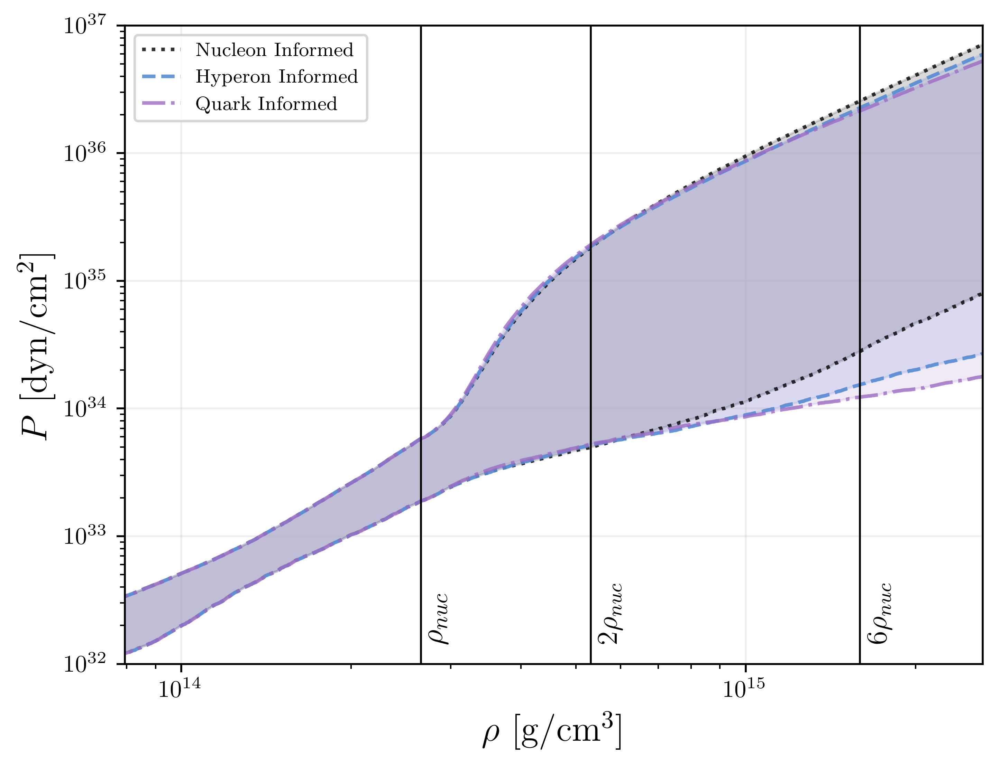

In [21]:
plt.loglog()

plt.plot(plot_densities,nucleon_sigmas[:,0], color = "k", linestyle = ":", alpha = .8, label = r"Nucleon Informed") 
plt.plot(plot_densities,nucleon_sigmas[:,1], color = "k", linestyle = ":", alpha = .8)
plt.plot(plot_densities,hyperon_sigmas[:,0], color = "#558BD4",linestyle = "--", alpha = .9, label = "Hyperon Informed") 
plt.plot(plot_densities,hyperon_sigmas[:,1], color = "#558BD4",linestyle = "--", alpha = .9)
plt.plot(plot_densities,quark_sigmas[:,0], color = "#9D6DC4", linestyle = "-.", alpha = .8, label = r"Quark Informed") 
plt.plot(plot_densities,quark_sigmas[:,1], color = "#9D6DC4", linestyle = "-.", alpha = .8)

plt.fill_between(plot_densities,nucleon_sigmas[:,0], nucleon_sigmas[:,1], alpha = 0.15, color = "k")
plt.fill_between(plot_densities,hyperon_sigmas[:,0], hyperon_sigmas[:,1], alpha = 0.15, color = "#558BD4")
plt.fill_between(plot_densities,quark_sigmas[:,0], quark_sigmas[:,1], alpha = 0.15, color = "#9D6DC4")


plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, np.power(10.0,32.),np.power(10.0,37.0)])
plt.grid(alpha = 0.2)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)

plt.legend(fontsize = 8.)


plt.gcf().set_dpi(500)
# plt.savefig(f"Pressure-Density (GP vs MM+GP)", dpi = 500)

plt.show()

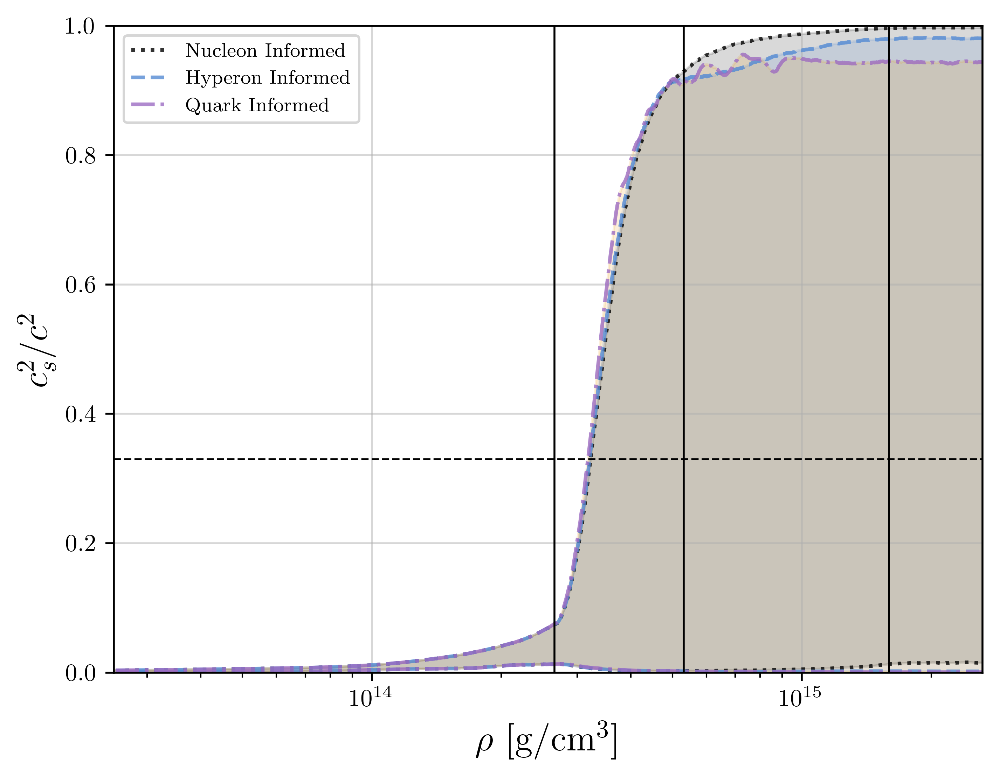

In [22]:
plt.semilogx()

plt.plot(plot_densities,nucleon_cs_sigmas[:,0], color = "k", linestyle = ":", alpha = .8, label = r"Nucleon Informed") 
plt.plot(plot_densities,nucleon_cs_sigmas[:,1], color = "k", linestyle = ":", alpha = .8)
plt.plot(plot_densities,hyperon_cs_sigmas[:,0], color = "#558BD4",linestyle = "--", alpha = .8, label = "Hyperon Informed") 
plt.plot(plot_densities,hyperon_cs_sigmas[:,1], color = "#558BD4",linestyle = "--", alpha = .8)
plt.plot(plot_densities,quark_cs_sigmas[:,0], color = "#9D6DC4", linestyle = "-.", alpha = .8, label = r"Quark Informed") 
plt.plot(plot_densities,quark_cs_sigmas[:,1], color = "#9D6DC4", linestyle = "-.", alpha = .8)

plt.fill_between(plot_densities,nucleon_cs_sigmas[:,0], nucleon_cs_sigmas[:,1], alpha = 0.15, color = "k")
plt.fill_between(plot_densities,hyperon_cs_sigmas[:,0], hyperon_cs_sigmas[:,1], alpha = 0.15, color = "#558BD4")
plt.fill_between(plot_densities,quark_cs_sigmas[:,0], quark_cs_sigmas[:,1], alpha = 0.15, color = "#ED9910")

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$c_{s}^{2}/c^{2}$", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.4), 9.9*rho_nuc_in_cgs, 0.0, 1.0])
plt.grid(alpha = 0.2)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axhline(y = 0.33, color = "k", linewidth = .8, linestyle = "--")

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,36.5))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,36.5))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,36.5))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)

plt.legend(fontsize = 8.)
plt.grid(alpha = .5)
plt.gcf().set_dpi(500)


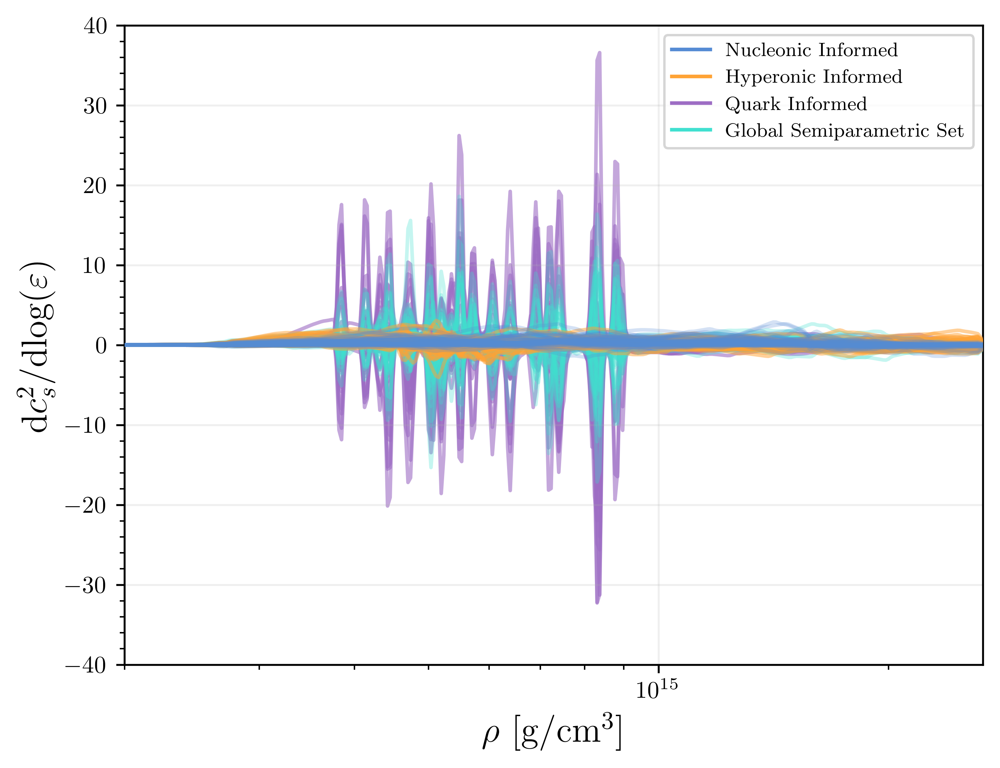

In [18]:
plt.semilogx()
for eos in range(int(len(nuc_eos_to_be_used)/300)):

    nuc_cs = np.gradient(nucleon_data[eos]["pressurec2"], nucleon_data[eos]["energy_densityc2"])
    hyp_cs = np.gradient(hyperon_data[eos]["pressurec2"], hyperon_data[eos]["energy_densityc2"])
    quark_cs = np.gradient(quark_data[eos]["pressurec2"], quark_data[eos]["energy_densityc2"])
    
    plt.plot(nucleon_data[eos]["baryon_density"],
             np.gradient(nuc_cs, np.log(nucleon_data[eos]["energy_densityc2"])),
            color = colors["nucleon"], alpha = 0.25, zorder = 12)
    plt.plot(hyperon_data[eos]["baryon_density"],
             np.gradient(hyp_cs, np.log(hyperon_data[eos]["energy_densityc2"])),
            color = colors["hyperon"], alpha = 0.5, zorder = 7)
    plt.plot(quark_data[eos]["baryon_density"],
             np.gradient(quark_cs, np.log(quark_data[eos]["energy_densityc2"])),
            color = "#9D6DC4", alpha = 0.6, zorder = 0)

for eos in range(int(len(mm_eos_to_be_used)/900)):
    mm_cs = np.gradient(mm_micro_data[eos]["pressurec2"], mm_micro_data[eos]["energy_densityc2"])
    plt.plot(mm_micro_data[eos]["baryon_density"],
             np.gradient(mm_cs, np.log(mm_micro_data[eos]["energy_densityc2"])),
            color = colors["semiparamcs"], alpha = 0.3, zorder = 3)


plt.minorticks_on()
plt.axis([2e14, 10*rho_nuc_in_cgs, -40., 40.])

plt.xlabel(r"$\rho$ [g/cm$^{3}$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"d$c_{s}^{2}$/dlog($\varepsilon$)", math_fontfamily="cm", fontsize = 15.)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color= colors["hyperon"], label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
mm_line = mlines.Line2D([], [], color=colors["semiparamcs"], label="Global Semiparametric Set")
plt.legend(handles=[nuc_line,hyp_line, quark_line, mm_line], fontsize = 8)

plt.grid(alpha = 0.2)
plt.gcf().set_dpi(500)
plt.show()

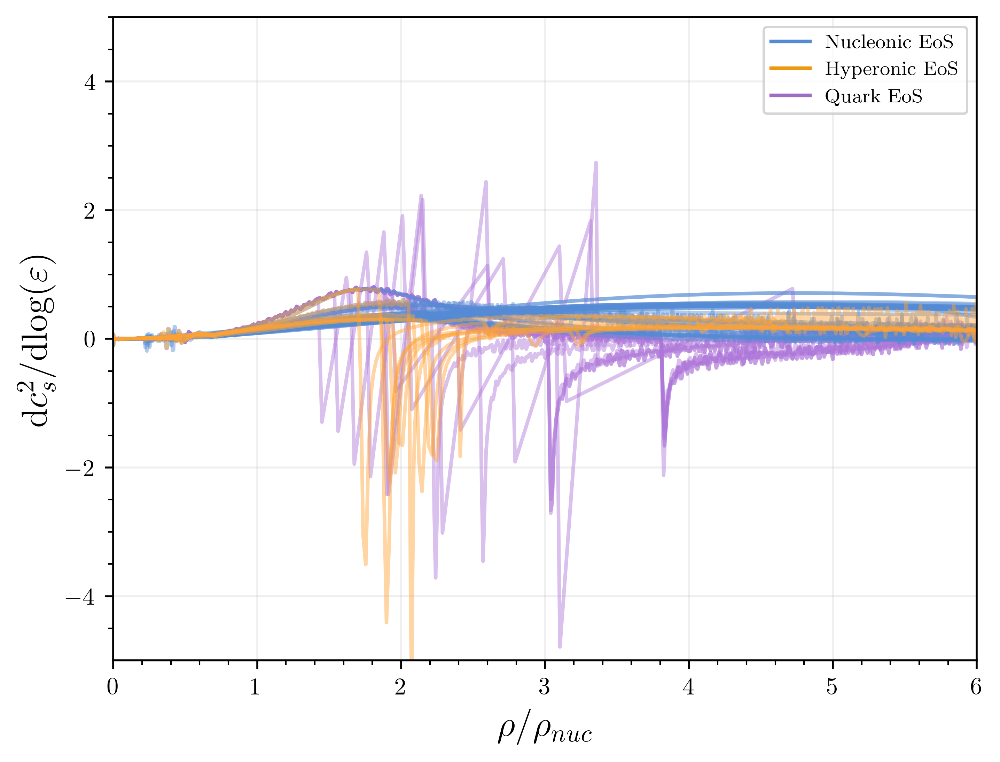

In [96]:
for matter in matter_groups:
    eos_list = os.listdir(f"{nuclear_eoss_path}/{matter}")
    for eos in eos_list:
        eos_name = os.path.splitext(eos)[0]
        theory_cs = np.gradient(nuc_eos_data[f"{matter}"][eos_name]["pressurec2"],
                                nuc_eos_data[f"{matter}"][eos_name]["energy_densityc2"])

        plt.plot(nuc_eos_data[f"{matter}"][eos_name]["baryon_density"]/rho_nuc_in_cgs,
                 np.gradient(theory_cs, np.log(nuc_eos_data[f"{matter}"][eos_name]["energy_densityc2"])),
                color = colors[f"{matter}"], alpha = 0.45)

plt.minorticks_on()
plt.axis([0.0, 6.0, -5., 5.0])

plt.xlabel(r"$\rho/\rho_{nuc}$", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"d$c_{s}^{2}$/dlog($\varepsilon$)", math_fontfamily="cm", fontsize = 15.)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic EoS')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic EoS")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark EoS")
plt.legend(handles=[nuc_line, hyp_line, quark_line], fontsize = 8)

plt.grid(alpha = 0.2)
plt.gcf().set_dpi(500)

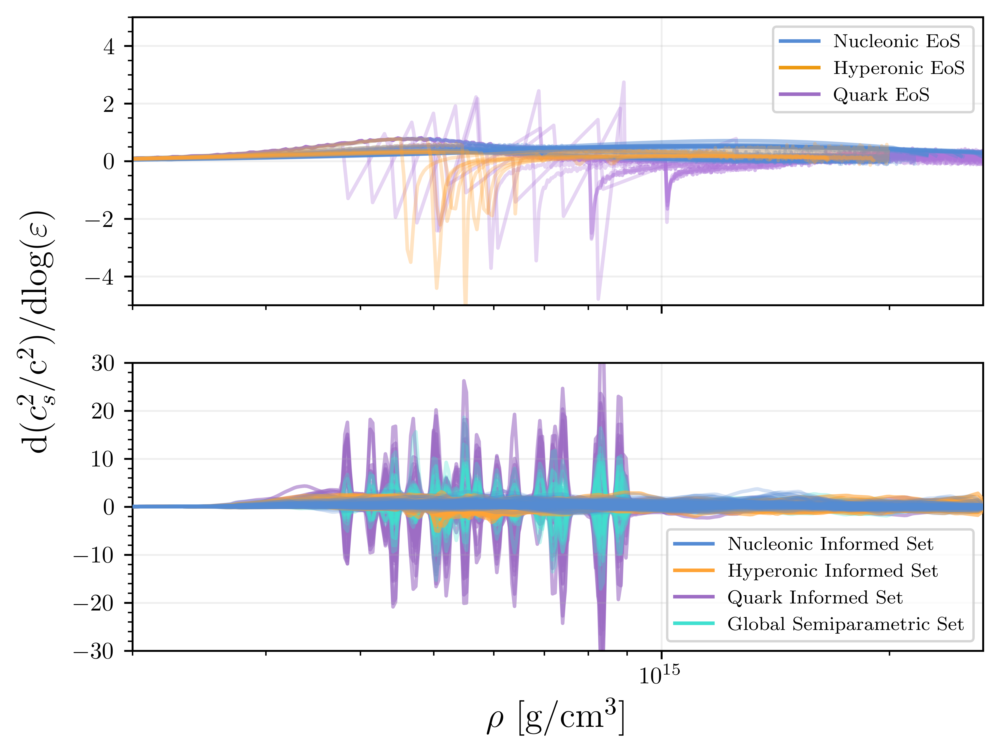

In [35]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True)
plt.semilogx()

for matter in matter_groups:
    eos_list = os.listdir(f"{nuclear_eoss_path}/{matter}")
    for eos in eos_list:
        eos_name = os.path.splitext(eos)[0]
        theory_cs = np.gradient(nuc_eos_data[f"{matter}"][eos_name]["pressurec2"],
                                nuc_eos_data[f"{matter}"][eos_name]["energy_densityc2"])
        
        ax1.plot(nuc_eos_data[f"{matter}"][eos_name]["baryon_density"],
                 np.gradient(theory_cs, np.log(nuc_eos_data[f"{matter}"][eos_name]["energy_densityc2"])),
                color = colors[f"{matter}"], alpha = 0.3)

for eos in range(int(len(nuc_eos_to_be_used)/150)):

    nuc_cs = np.gradient(nucleon_data[eos]["pressurec2"], nucleon_data[eos]["energy_densityc2"])
    hyp_cs = np.gradient(hyperon_data[eos]["pressurec2"], hyperon_data[eos]["energy_densityc2"])
    quark_cs = np.gradient(quark_data[eos]["pressurec2"], quark_data[eos]["energy_densityc2"])
    
    ax2.plot(nucleon_data[eos]["baryon_density"],
             np.gradient(nuc_cs, np.log(nucleon_data[eos]["energy_densityc2"])),
            color = colors["nucleon"], alpha = 0.25, zorder = 12)
    ax2.plot(hyperon_data[eos]["baryon_density"],
             np.gradient(hyp_cs, np.log(hyperon_data[eos]["energy_densityc2"])),
            color = colors["hyperon"], alpha = 0.6, zorder = 7)
    ax2.plot(quark_data[eos]["baryon_density"],
             np.gradient(quark_cs, np.log(quark_data[eos]["energy_densityc2"])),
            color = "#9D6DC4", alpha = 0.6, zorder = 0)

for eos in range(int(len(mm_eos_to_be_used)/900)):
    mm_cs = np.gradient(mm_micro_data[eos]["pressurec2"], mm_micro_data[eos]["energy_densityc2"])
    ax2.plot(mm_micro_data[eos]["baryon_density"],
             np.gradient(mm_cs, np.log(mm_micro_data[eos]["energy_densityc2"])),
            color = colors["semiparamcs"], alpha = 0.3, zorder = 3)
    
ax1.minorticks_on()
ax2.minorticks_on()
ax1.axis([2e14, 10*rho_nuc_in_cgs, -5., 5.0])
ax2.axis([2e14, 10*rho_nuc_in_cgs, -30., 30.])

plt.xlabel(r"$\rho$ [g/cm$^{3}$]", math_fontfamily = "cm", fontsize = 15.)
# plt.ylabel(r"d$c_{s}^{2}$/dlog($\varepsilon$)", math_fontfamily="cm", fontsize = 15.)
fig.supylabel(r"d($c_{s}^{2}$/c$^{2}$)/dlog($\varepsilon$)", math_fontfamily="cm", fontsize = 15.)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic EoS')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic EoS")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark EoS")
ax1.legend(handles=[nuc_line, hyp_line, quark_line], fontsize = 8)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed Set')
hyp_line = mlines.Line2D([], [], color= colors["hyperon"], label="Hyperonic Informed Set")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed Set")
mm_line = mlines.Line2D([], [], color=colors["semiparamcs"], label="Global Semiparametric Set")
ax2.legend(handles=[nuc_line,hyp_line, quark_line, mm_line], fontsize = 8, loc = "lower right")

ax1.grid(alpha = 0.2)
ax2.grid(alpha = 0.2)
plt.gcf().set_dpi(800)
plt.show()

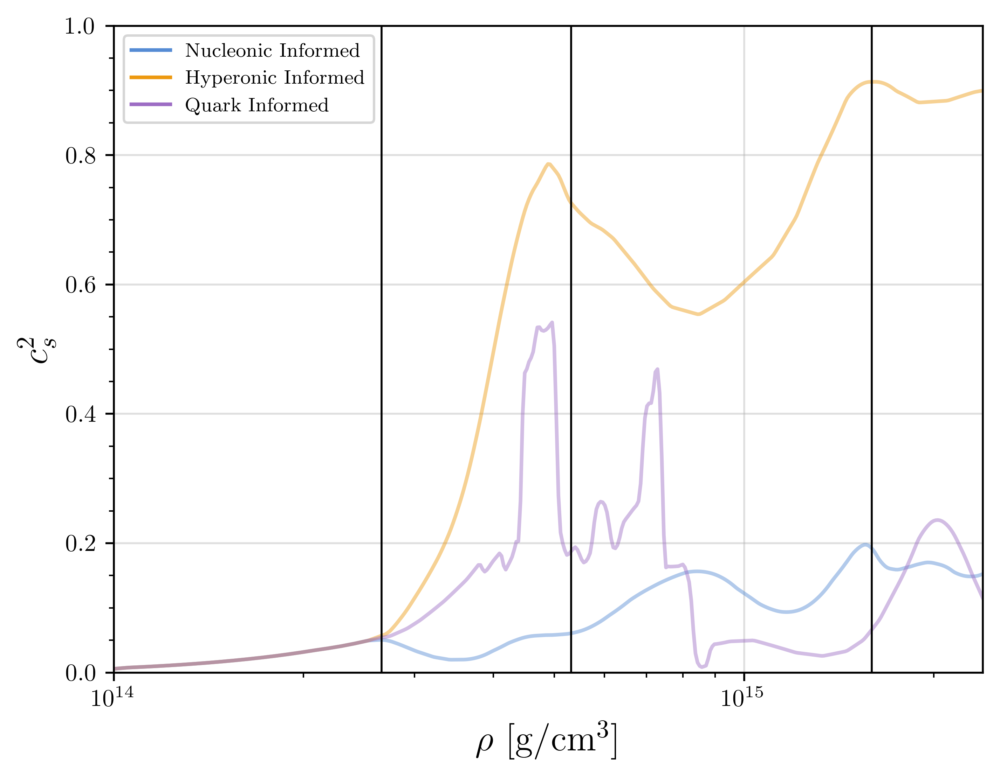

In [76]:
plt.semilogx()
for eos in range(50):
    if eos < 49:
        continue
    nuc_cs = np.gradient(nucleon_data[eos]["pressurec2"], nucleon_data[eos]["energy_densityc2"])
    hyp_cs = np.gradient(hyperon_data[eos]["pressurec2"], hyperon_data[eos]["energy_densityc2"])
    quark_cs = np.gradient(quark_data[eos]["pressurec2"], quark_data[eos]["energy_densityc2"])
    
    plt.plot(nucleon_data[eos]["baryon_density"],
             nuc_cs,
            color = "#558BD4", alpha = 0.45)
    plt.plot(hyperon_data[eos]["baryon_density"],
             hyp_cs,
            color = "#ED9910", alpha = 0.45)
    plt.plot(quark_data[eos]["baryon_density"],
             quark_cs,
            color = "#9D6DC4", alpha = 0.45)

plt.minorticks_on()
plt.axis([1e14, 9*rho_nuc_in_cgs, 0., 1.0])

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$c_{s}^{2}$", math_fontfamily="cm", fontsize = 15.)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[nuc_line,hyp_line, quark_line], fontsize = 8)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.grid(alpha = 0.4)
plt.gcf().set_dpi(500)
plt.show()

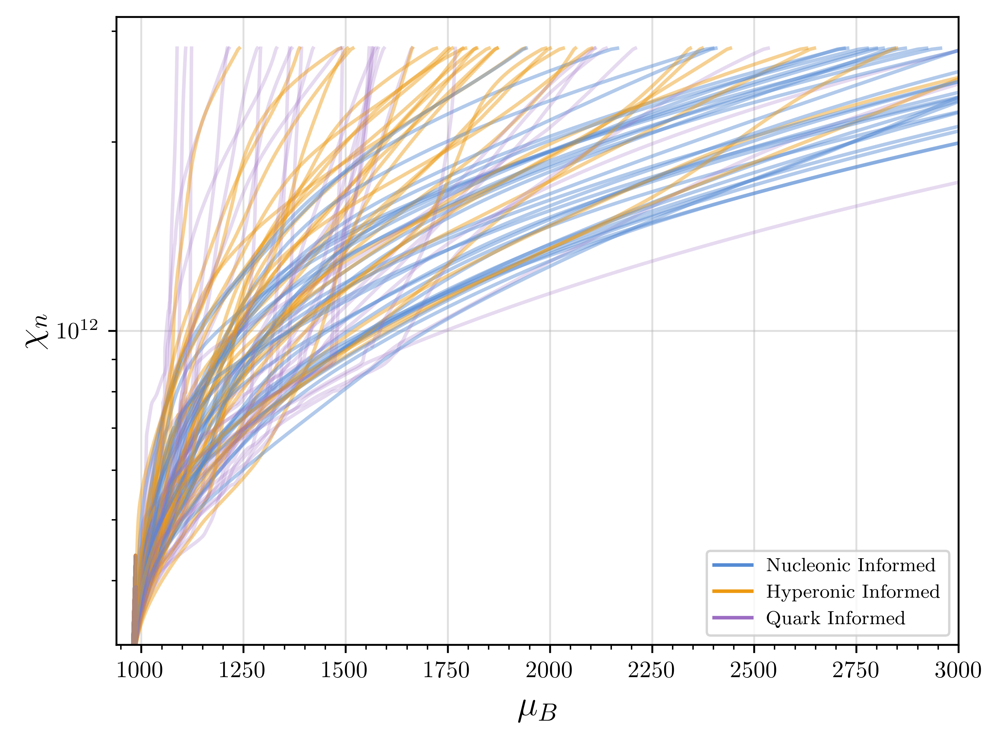

In [35]:
plt.semilogy()
for eos in range(int(len(nuc_eos_to_be_used)/500)):
    
    nuc_mu = chem_potent(nucleon_data[eos]["pressurec2"],
                         nucleon_data[eos]["energy_densityc2"],
                         nucleon_data[eos]["baryon_density"])*939.
    nuc_sus = np.gradient(nucleon_data[eos]["pressurec2"], nuc_mu)
    
    hyp_mu = chem_potent(hyperon_data[eos]["pressurec2"],
                         hyperon_data[eos]["energy_densityc2"],
                         hyperon_data[eos]["baryon_density"])*939.
    hyp_sus = np.gradient(hyperon_data[eos]["pressurec2"], hyp_mu)
    
    qu_mu = chem_potent(quark_data[eos]["pressurec2"],
                         quark_data[eos]["energy_densityc2"],
                         quark_data[eos]["baryon_density"])*939.
    quark_sus = np.gradient(quark_data[eos]["pressurec2"], qu_mu)
    
    
    plt.plot(nuc_mu,
             nuc_sus,
            color = "#558BD4", alpha = 0.45)
    plt.plot(hyp_mu,
             hyp_sus,
            color = "#ED9910", alpha = 0.45)
    plt.plot(qu_mu,
             quark_sus,
            color = "#9D6DC4", alpha = 0.25)

plt.minorticks_on()
plt.axis([939., 3000., np.power(10., 11.5), np.power(10., 12.5)])

plt.xlabel(r"$\mu_{B}$", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$\chi_{n}$", math_fontfamily="cm", fontsize = 15.)

nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[nuc_line,hyp_line, quark_line], fontsize = 8)

plt.grid(alpha = 0.4)
plt.gcf().set_dpi(500)
plt.show()

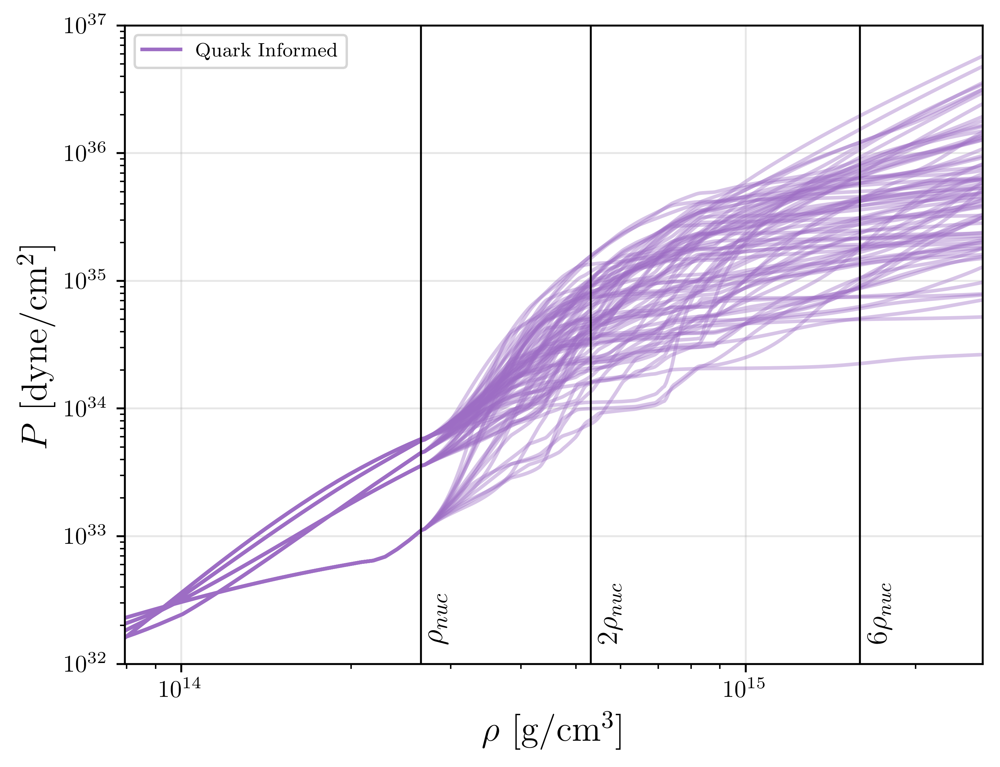

In [21]:
plt.loglog()
for eos in range(int(len(nuc_eos_to_be_used)/200))[::-1]:
    
    # plt.plot(nucleon_data[eos]["baryon_density"],
    #          nucleon_data[eos]["pressurec2"]*gcm3_to_dynecm2,
    #         color = "#558BD4", alpha = 0.4)
    # plt.plot(hyperon_data[eos]["baryon_density"],
    #          hyperon_data[eos]["pressurec2"]*gcm3_to_dynecm2,
    #         color = "#ED9910", alpha = 0.4)
    plt.plot(quark_data[eos]["baryon_density"],
            quark_data[eos]["pressurec2"]*gcm3_to_dynecm2,
            color = "#9D6DC4", alpha = 0.4)

plt.minorticks_on()

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, np.power(10.0,32.),np.power(10.0,37.0)])
plt.grid(alpha = 0.3)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[#nuc_line,
                    #hyp_line,
                    quark_line], fontsize = 8)
plt.gcf().set_dpi(500)
plt.show()

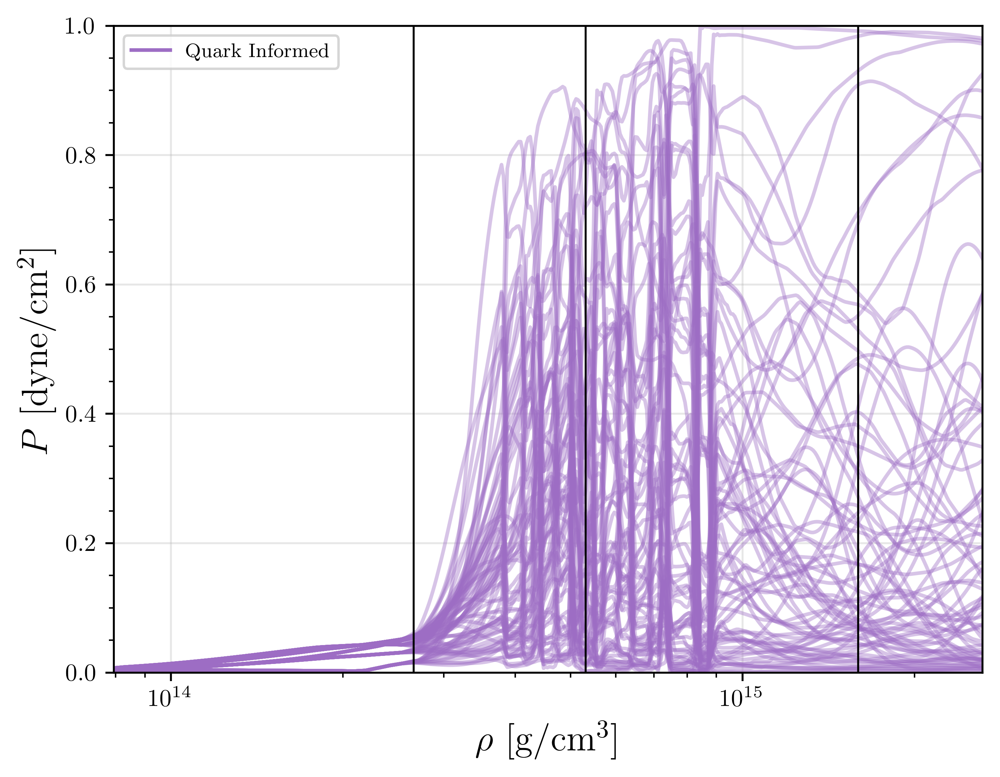

In [16]:
plt.semilogx()
for eos in range(int(len(nuc_eos_to_be_used)/200))[::-1]:

    plt.plot(quark_data[eos]["baryon_density"],
            np.gradient(quark_data[eos]["pressurec2"], quark_data[eos]["energy_densityc2"]),
            color = "#9D6DC4", alpha = 0.4)

plt.minorticks_on()

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
# plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, 0.0, 1.0])
plt.grid(alpha = 0.3)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[#nuc_line,
                    #hyp_line,
                    quark_line], fontsize = 8)
plt.gcf().set_dpi(500)
plt.show()

In [33]:
nuc_pts = {}
hyp_pts = {}
qu_pts = {}
### Let's see how many phase transitions each set has per EOS
for eos in range(int(len(nuc_eos_to_be_used))):
    nuc_pts[f"eos_{eos:06d}_pts"] = find_pts(nucleon_data, eos, threshold = 0.0)
    hyp_pts[f"eos_{eos:06d}_pts"] = find_pts(hyperon_data, eos, threshold = 0.0)
    qu_pts[f"eos_{eos:06d}_pts"] = find_pts(quark_data, eos, threshold = 0.0)
    

In [34]:
nuc_num_pts = []
hyp_num_pts = []
qua_num_pts = []
for num in range(int(len(nuc_eos_to_be_used))):
    nuc_num_pts.append(nuc_pts[f"eos_{num:06d}_pts"])
    hyp_num_pts.append(hyp_pts[f"eos_{num:06d}_pts"])
    qua_num_pts.append(qu_pts[f"eos_{num:06d}_pts"])

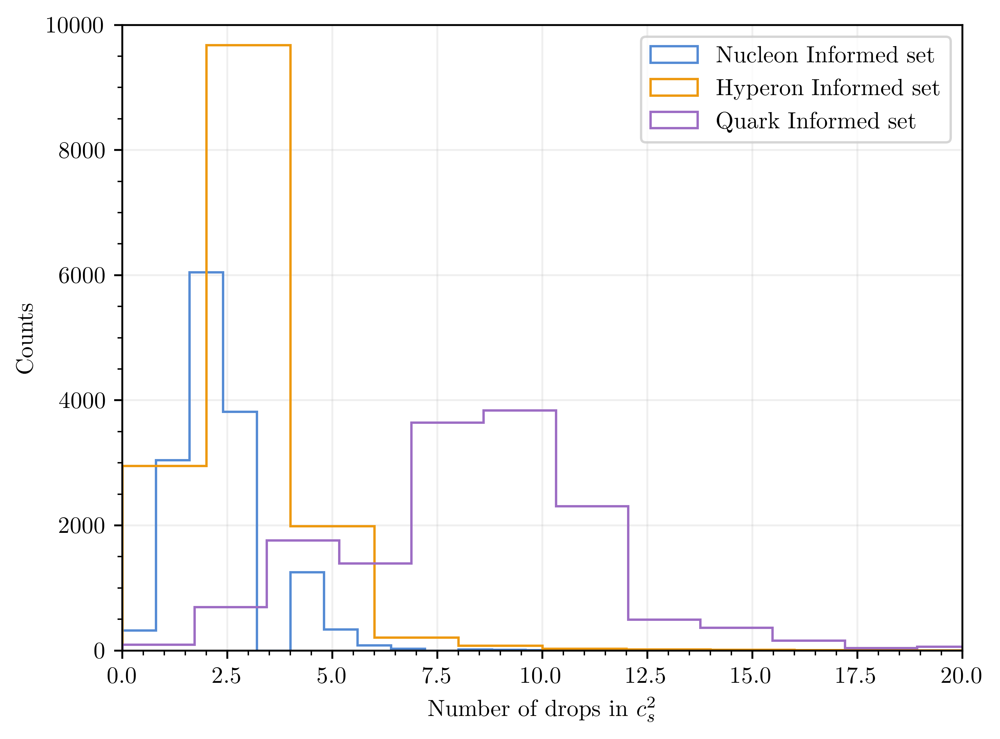

In [46]:
plt.hist(nuc_num_pts, bins = 25, color = colors["nucleon"],
         histtype = "step",
         label = "Nucleon Informed set")
plt.hist(hyp_num_pts, bins = 25, color = colors["hyperon"],
         histtype = "step",
         label = "Hyperon Informed set")
plt.hist(qua_num_pts, bins = 25, color = colors["quark"],
         histtype = "step",
         label = "Quark Informed set")
plt.gcf().set_dpi(500)
plt.grid(alpha = 0.2)
plt.axis([0.0, 20.0, 0.0, 10000])
plt.minorticks_on()
plt.legend()
plt.ylabel("Counts")
plt.xlabel("Number of drops in $c_{s}^{2}$")
plt.show()

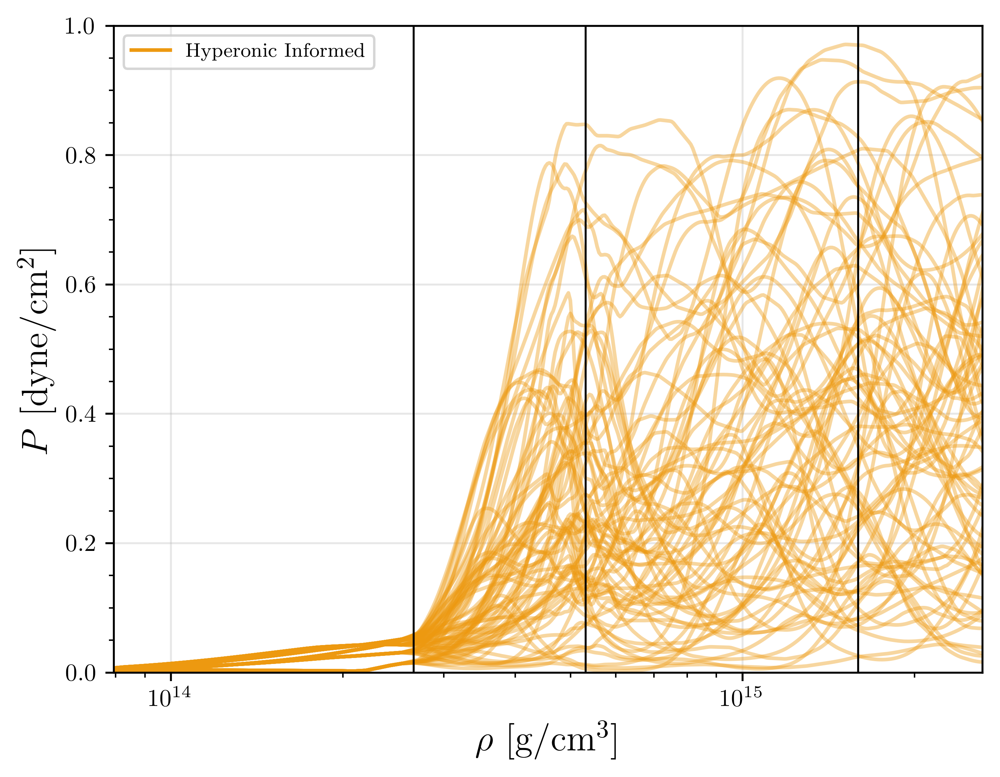

In [37]:
plt.semilogx()
for eos in range(int(len(nuc_eos_to_be_used)/200))[::-1]:

    plt.plot(hyperon_data[eos]["baryon_density"],
            np.gradient(hyperon_data[eos]["pressurec2"], hyperon_data[eos]["energy_densityc2"]),
            color = colors["hyperon"], alpha = 0.4)

plt.minorticks_on()

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, 0.0, 1.0])
plt.grid(alpha = 0.3)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[#nuc_line,
                    hyp_line], fontsize = 8)
                    # quark_line] )
plt.gcf().set_dpi(500)
plt.show()

In [49]:
dd2_eos = nuc_eos_data["quark"]["DD2_NJL_B15"]
dd2_bary = nuc_eos_data["quark"]["DD2_NJL_B15"]["baryon_density"]
dd2_press = dd2_eos["pressurec2"]

nl3_hyp = nuc_eos_data["hyperon"]["TM1wr_US30"]
nl3_bary = nl3_hyp["baryon_density"]
nl3_press = nl3_hyp["pressurec2"]

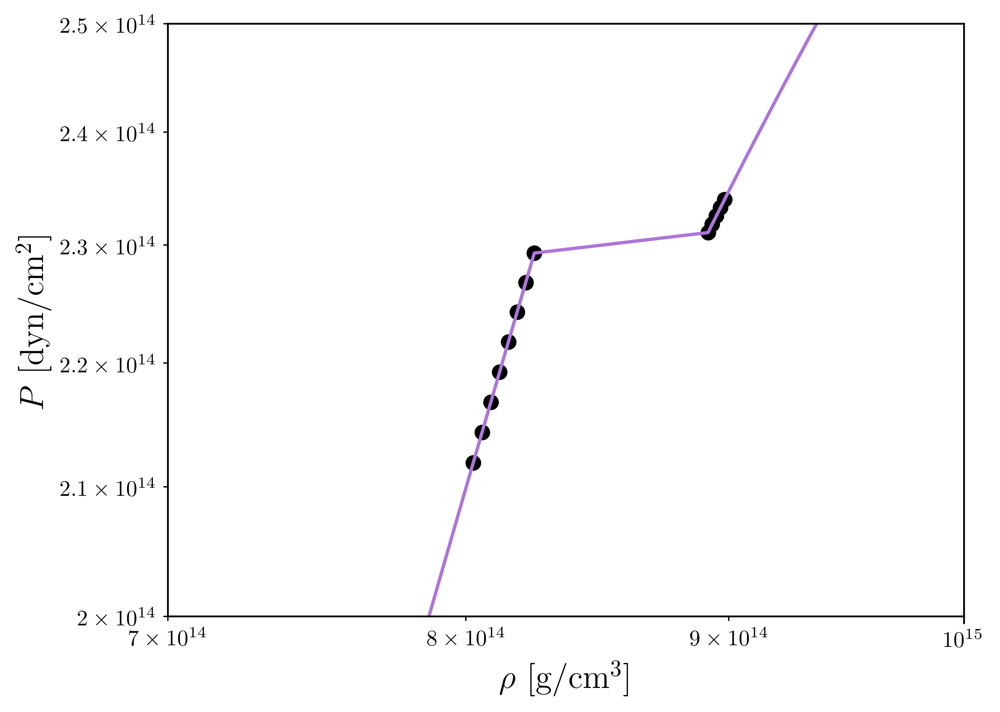

In [42]:
plt.loglog()
plt.plot(dd2_eos["baryon_density"], dd2_eos["pressurec2"], alpha = 1.0, color = colors["quark"])
plt.scatter(dd2_eos["baryon_density"][333:346], dd2_eos["pressurec2"][333:346], color = "k")
plt.axis([7e14, 1e15, 2e14, 2.5e14])
plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)
plt.gcf().set_dpi(500)
plt.grid(alpha = 0.2)
plt.minorticks_on()
plt.show()

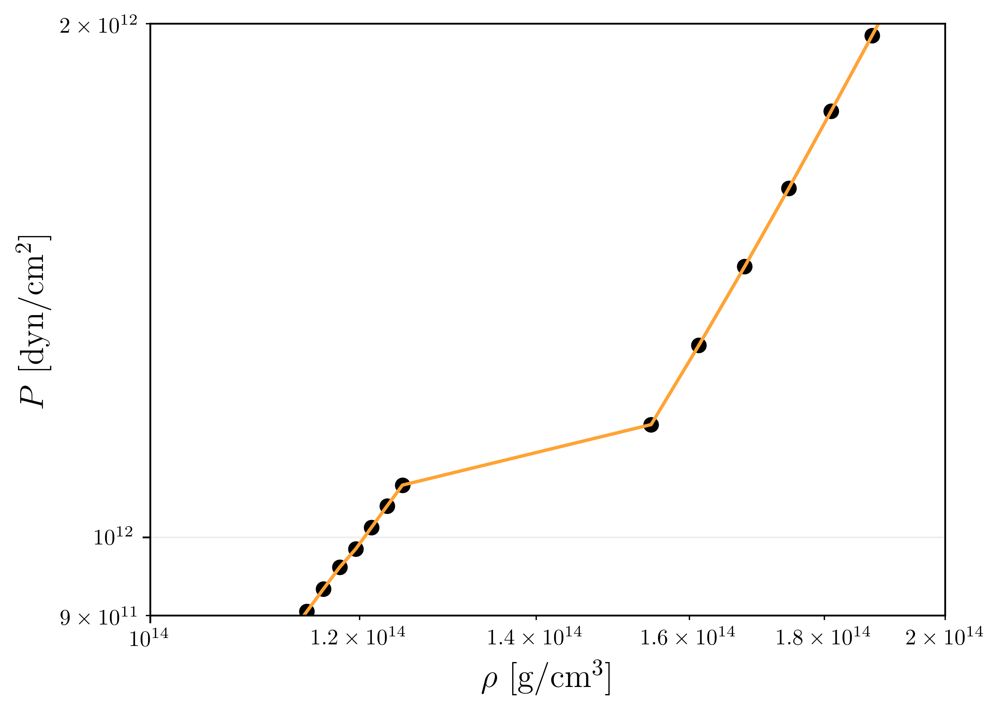

In [60]:
plt.loglog()
plt.plot(nl3_bary, nl3_press, alpha = 1.0, color = colors["hyperon"])
plt.scatter(nl3_hyp["baryon_density"][719:740], nl3_hyp["pressurec2"][719:740], color = "k")
plt.axis([1e14, 2e14, 9e11, 2e12])
plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)
plt.gcf().set_dpi(500)
plt.grid(alpha = 0.2)
plt.minorticks_on()
plt.show()

In [125]:
print("DD2_NJL_B15: With pressure in dyn/cm^2 and energy density in g/cm^3:")
print("Onset pressure of DD2 phase transition: ", "{:.2e}".format(dd2_eos["pressurec2"][340]*gcm3_to_dynecm2))
print("Ending pressure of DD2 phase transition: ", "{:.2e}".format(dd2_eos["pressurec2"][341]*gcm3_to_dynecm2))
print("Onset energy density of DD2 phase transition: ", "{:.2e}".format(dd2_eos["energy_densityc2"][340]))
print("Ending energy density of DD2 phase transition: ", "{:.2e}".format(dd2_eos["energy_densityc2"][341]))
print("Change in energy density: ", "{:.2e}".format(dd2_eos["energy_densityc2"][341]-dd2_eos["energy_densityc2"][340]))
print("Change in energy density [MeV/fm^3]: ", (dd2_eos["energy_densityc2"][341]-dd2_eos["energy_densityc2"][340]) / MeV_to_gcm3)
dd2_cs = np.gradient(dd2_eos["pressurec2"], dd2_eos["energy_densityc2"])
print("Change in sound speed over phase transition: ", dd2_cs[340]-dd2_cs[341])

DD2_NJL_B15: With pressure in dyn/cm^2 and energy density in g/cm^3:
Onset pressure of DD2 phase transition:  2.06e+35
Ending pressure of DD2 phase transition:  2.08e+35
Onset energy density of DD2 phase transition:  9.43e+14
Ending energy density of DD2 phase transition:  1.04e+15
Change in energy density:  9.51e+13
Change in energy density [MeV/fm^3]:  53.32283366202207
Change in sound speed over phase transition:  0.23428116359623674


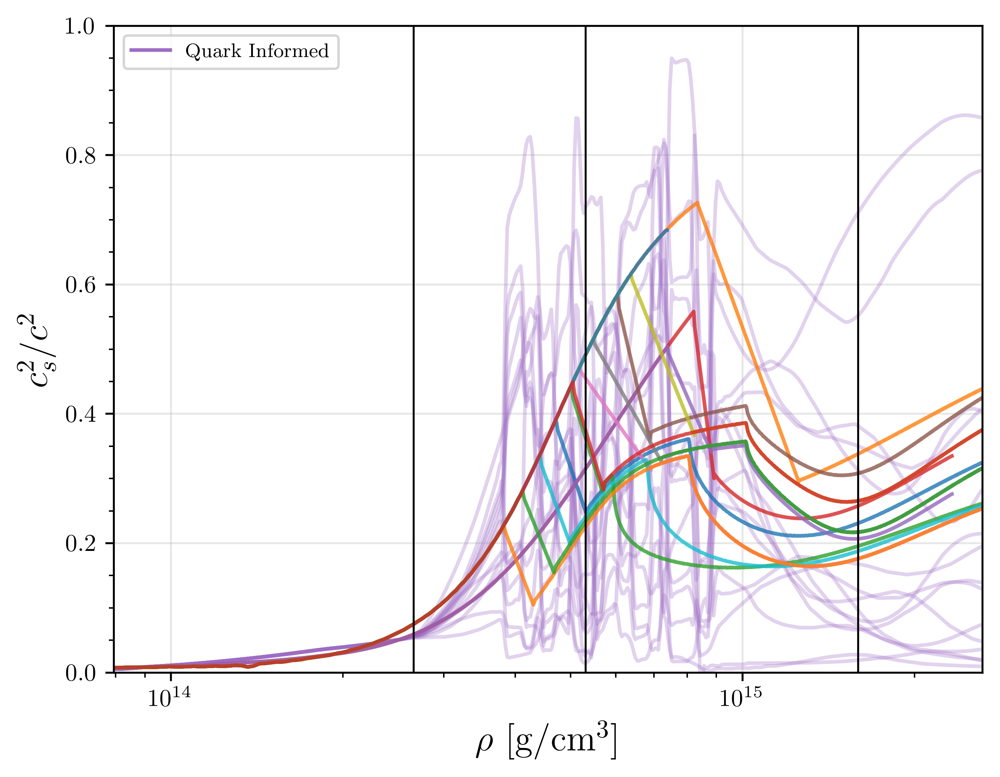

In [21]:
plt.semilogx()
for eos in range(int(len(nuc_eos_to_be_used)/1000)):
    plt.plot(quark_data[eos]["baryon_density"],
            np.gradient(quark_data[eos]["pressurec2"], quark_data[eos]["energy_densityc2"]),
            color = colors["quark"], alpha = 0.3)

for eos in nuc_eos_data["quark"]:
    plt.plot(nuc_eos_data["quark"][eos]["baryon_density"],
             np.gradient(nuc_eos_data["quark"][eos]["pressurec2"], nuc_eos_data["quark"][eos]["energy_densityc2"]),
             label = f"{eos}", alpha = 0.8)
    

plt.minorticks_on()

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$c_{s}^{2}/c^{2}$", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, 0.0, 1.0])
plt.grid(alpha = 0.3)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
plt.legend(handles=[#nuc_line,
                    # hyp_line],
                    quark_line], fontsize = 8)
plt.gcf().set_dpi(500)
plt.show()

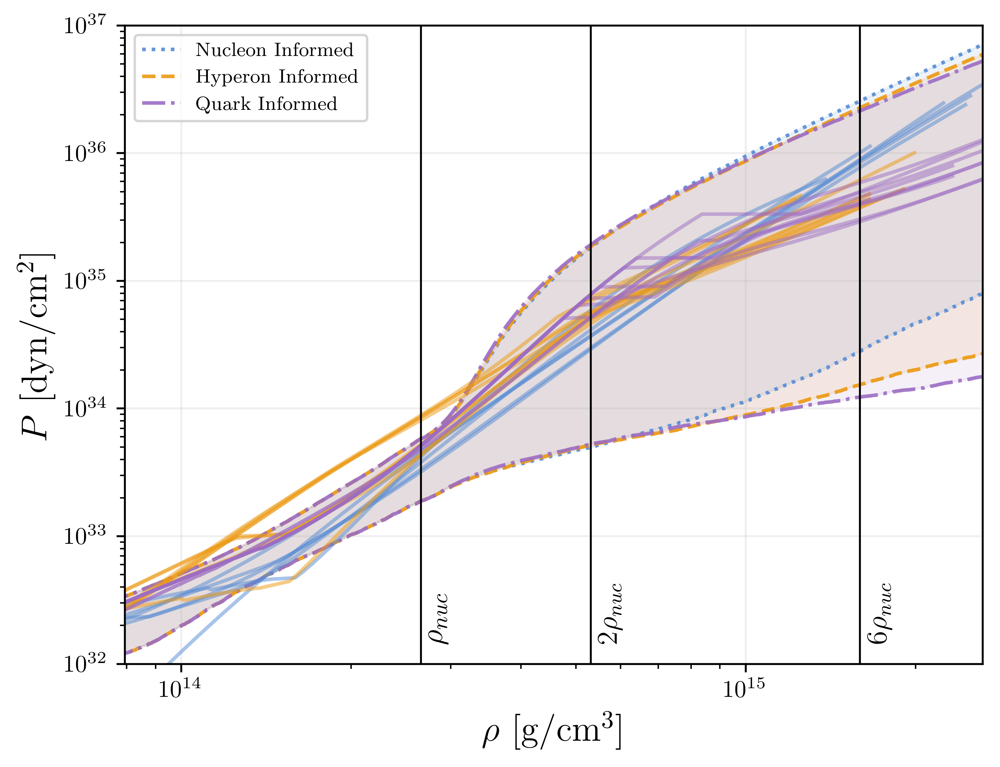

In [17]:
plt.loglog()

plt.plot(plot_densities,nucleon_sigmas[:,0], color = colors["nucleon"], linestyle = ":", alpha = .9, label = r"Nucleon Informed") 
plt.plot(plot_densities,nucleon_sigmas[:,1], color = colors["nucleon"], linestyle = ":", alpha = .9)
plt.plot(plot_densities,hyperon_sigmas[:,0], color = colors["hyperon"],linestyle = "--", alpha = .9, label = "Hyperon Informed") 
plt.plot(plot_densities,hyperon_sigmas[:,1], color = colors["hyperon"],linestyle = "--", alpha = .9)
plt.plot(plot_densities,quark_sigmas[:,0], color = colors["quark"], linestyle = "-.", alpha = .9, label = r"Quark Informed") 
plt.plot(plot_densities,quark_sigmas[:,1], color = colors["quark"], linestyle = "-.", alpha = .9)

nuc_eos_count = 0
hyp_eos_count = 0
qua_eos_count = 0
for eos in nuc_eos_data["nucleon"].keys():
    nuc_eos_count += 1
    if nuc_eos_count > 6:
        break
    plt.plot(nuc_eos_data["nucleon"][eos]["baryon_density"],
             nuc_eos_data["nucleon"][eos]["pressurec2"]*gcm3_to_dynecm2,
             color = colors["nucleon"],
             alpha = 0.5)

for eos in nuc_eos_data["hyperon"].keys():
    hyp_eos_count += 1
    if hyp_eos_count > 9:
        break
    plt.plot(nuc_eos_data["hyperon"][eos]["baryon_density"],
             nuc_eos_data["hyperon"][eos]["pressurec2"]*gcm3_to_dynecm2,
             color = colors["hyperon"],
             alpha = 0.5)

for eos in nuc_eos_data["quark"].keys():
    qua_eos_count += 1
    if qua_eos_count > 9:
        break
    plt.plot(nuc_eos_data["quark"][eos]["baryon_density"],
             nuc_eos_data["quark"][eos]["pressurec2"]*gcm3_to_dynecm2,
             color = colors["quark"],
             alpha = 0.5)

plt.fill_between(plot_densities,nucleon_sigmas[:,0], nucleon_sigmas[:,1], alpha = 0.1, color = colors["nucleon"])
plt.fill_between(plot_densities,hyperon_sigmas[:,0], hyperon_sigmas[:,1], alpha = 0.1, color = colors["hyperon"])
plt.fill_between(plot_densities,quark_sigmas[:,0], quark_sigmas[:,1], alpha = 0.1, color = colors["quark"])


plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$P$ [dyn/cm$^2$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, np.power(10.0,32.),np.power(10.0,37.0)])
plt.grid(alpha = 0.2)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)

plt.legend(fontsize = 8.)
plt.gcf().set_dpi(500)
plt.show()

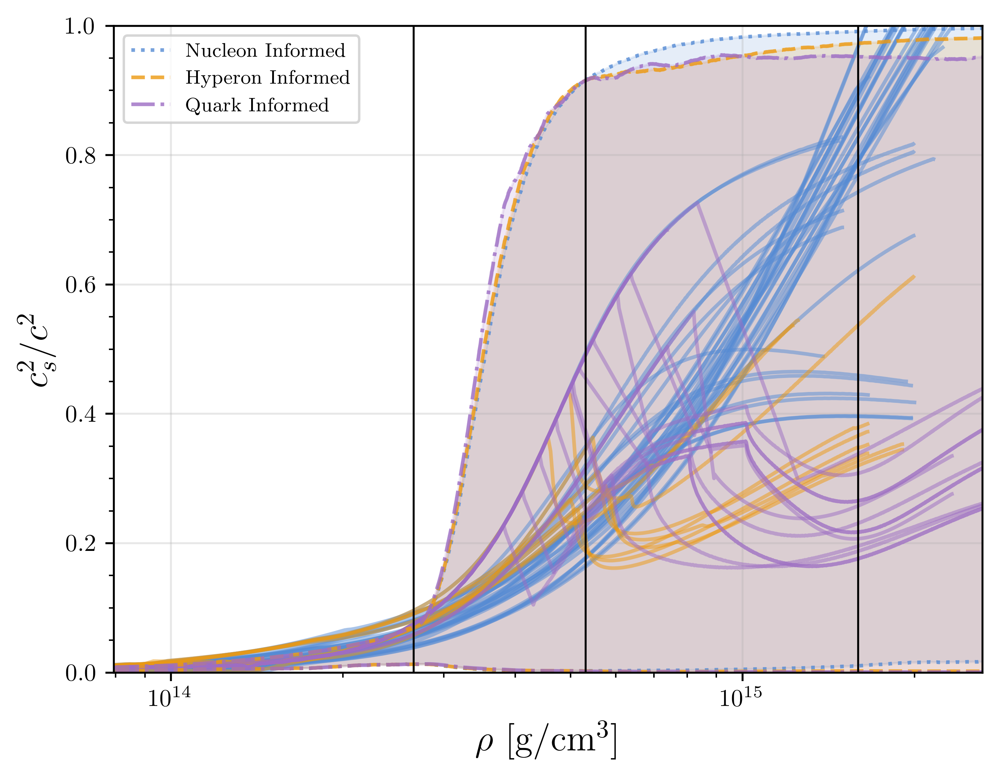

In [19]:
plt.semilogx()

for eos in nuc_eos_data["nucleon"].keys():
    plt.plot(nuc_eos_data["nucleon"][eos]["baryon_density"],
             np.gradient(nuc_eos_data["nucleon"][eos]["pressurec2"],nuc_eos_data["nucleon"][eos]["energy_densityc2"]),
             color = colors["nucleon"],
             alpha = 0.5)

for eos in nuc_eos_data["hyperon"].keys():
    plt.plot(nuc_eos_data["hyperon"][eos]["baryon_density"],
             np.gradient(nuc_eos_data["hyperon"][eos]["pressurec2"],nuc_eos_data["hyperon"][eos]["energy_densityc2"]),
             color = colors["hyperon"],
             alpha = 0.5)

for eos in nuc_eos_data["quark"].keys():
    plt.plot(nuc_eos_data["quark"][eos]["baryon_density"],
             np.gradient(nuc_eos_data["quark"][eos]["pressurec2"],nuc_eos_data["quark"][eos]["energy_densityc2"]),
             color = colors["quark"],
             alpha = 0.5)

plt.plot(plot_densities,nucleon_cs_sigmas[:,0], color = colors["nucleon"], linestyle = ":", alpha = .8, label = r"Nucleon Informed") 
plt.plot(plot_densities,nucleon_cs_sigmas[:,1], color = colors["nucleon"], linestyle = ":", alpha = .8)
plt.plot(plot_densities,hyperon_cs_sigmas[:,0], color = colors["hyperon"],linestyle = "--", alpha = .8, label = "Hyperon Informed") 
plt.plot(plot_densities,hyperon_cs_sigmas[:,1], color = colors["hyperon"],linestyle = "--", alpha = .8)
plt.plot(plot_densities,quark_cs_sigmas[:,0], color = colors["quark"], linestyle = "-.", alpha = .8, label = r"Quark Informed") 
plt.plot(plot_densities,quark_cs_sigmas[:,1], color = colors["quark"], linestyle = "-.", alpha = .8)

plt.fill_between(plot_densities,nucleon_cs_sigmas[:,0], nucleon_cs_sigmas[:,1], alpha = 0.15, color = colors["nucleon"])
plt.fill_between(plot_densities,hyperon_cs_sigmas[:,0], hyperon_cs_sigmas[:,1], alpha = 0.15, color = colors["hyperon"])
plt.fill_between(plot_densities,quark_cs_sigmas[:,0], quark_cs_sigmas[:,1], alpha = 0.15, color = colors["quark"])

plt.minorticks_on()

plt.xlabel(r"$\rho$ [g/cm$^3$]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$c_{s}^{2}/c^{2}$", math_fontfamily="cm", fontsize = 15.)

plt.axis([np.power(10.0,13.9), 9.9*rho_nuc_in_cgs, 0.0, 1.0])
plt.grid(alpha = 0.3)

plt.axvline(x = rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 2*rho_nuc_in_cgs, color = "k", linewidth = .8)
plt.axvline(x = 6*rho_nuc_in_cgs, color = "k", linewidth = .8)

plt.annotate(r"$\rho_{nuc}$",xy = ((rho_nuc_in_cgs), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 13.)
plt.annotate(r"$2\rho_{nuc}$",xy = ((2*rho_nuc_in_cgs)*(np.power(10.0,.012)), (np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
plt.annotate(r"$6\rho_{nuc}$",xy = ((6*rho_nuc_in_cgs)*(np.power(10.0,.012)),(np.power(10.,32.2))),
             rotation = 90.0, math_fontfamily = "cm", fontsize = 12.)
# nuc_line = mlines.Line2D([], [], color='#558BD4', label=r'Nucleonic Informed')
# hyp_line = mlines.Line2D([], [], color='#ED9910', label="Hyperonic Informed")
# quark_line = mlines.Line2D([], [], color='#9D6DC4', label="Quark Informed")
# plt.legend(handles=[nuc_line,
#                     hyp_line,
#                     quark_line], fontsize = 8)
plt.legend(fontsize=8)
plt.gcf().set_dpi(500)
plt.show()

In [30]:
nuc_tov_path = "/home/sunny.ng/XGEOSRecovery/eos_table/nuclear_set_PRD109-103029/tov_tables"
nuc_tov_data = {}
# full_eoss_path = "/home/sunny.ng/semiparameos/eos_table/nuclear_set_PRD109-103029/eos_tables/"
nuclear_eoss = os.listdir(nuc_tov_path)
for macros_file in nuclear_eoss:
    eos_name = os.path.splitext(macros_file)[0]
    macros = np.loadtxt(f"{nuc_tov_path}/{macros_file}", unpack = False,
                                    usecols = (0,1,3,4,10), ## assumes consistent storing convention
                        dtype=[('Pressure_central', 'f8'), ('rest_mass_density_central', 'f8'), ('R', 'f8'),
                                 ('M', 'f8'), ('Lambda', 'f8')])
    nuc_tov_data[f"{eos_name}"] = macros

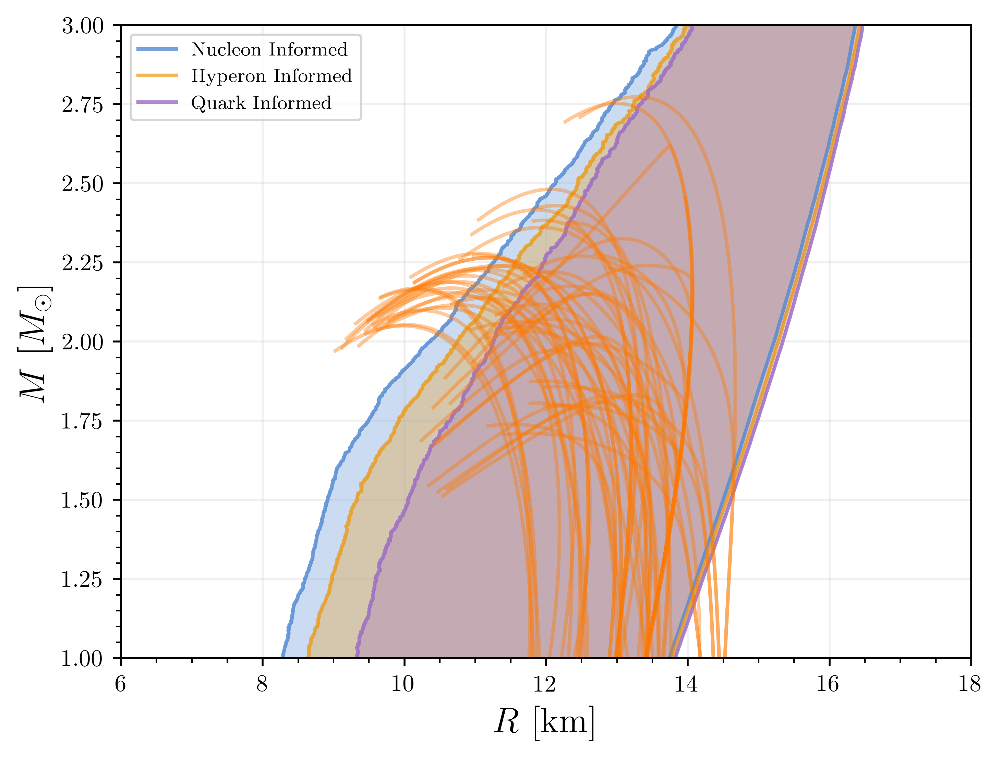

In [47]:
plt.plot(nucleon_mr_sigmas[:,0],plot_masses,color = colors["nucleon"], alpha = .8, label = labels["nucleon"]) 
plt.plot(nucleon_mr_sigmas[:,1],plot_masses,color = colors["nucleon"], alpha = .8)
plt.plot(hyperon_mr_sigmas[:,0],plot_masses,color = colors["hyperon"], alpha = .7, label = labels["hyperon"]) 
plt.plot(hyperon_mr_sigmas[:,1],plot_masses,color = colors["hyperon"], alpha = .7)
plt.plot(quark_mr_sigmas[:,0],plot_masses,color = colors["quark"], alpha = .8, label = labels["quark"]) 
plt.plot(quark_mr_sigmas[:,1],plot_masses,color = colors["quark"], alpha = .8)

plt.fill_betweenx(plot_masses, nucleon_mr_sigmas[:,0], nucleon_mr_sigmas[:,1], alpha = 0.3, color = colors["nucleon"])
plt.fill_betweenx(plot_masses, hyperon_mr_sigmas[:,0], hyperon_mr_sigmas[:,1], alpha = 0.3, color = colors["hyperon"])
plt.fill_betweenx(plot_masses, quark_mr_sigmas[:,0], quark_mr_sigmas[:,1], alpha = 0.3, color = colors["quark"])

for eos in nuc_tov_data:
    tov_data = nuc_tov_data[eos]
    plt.plot(tov_data["R"],tov_data["M"], alpha = 0.4, color = colors["Nuclear"])


plt.xlabel(r"$R$ [km]", math_fontfamily = "cm", fontsize = 15.)
plt.ylabel(r"$M$ [$M_{\odot}$]", math_fontfamily="cm", fontsize = 15.)

plt.axis([6., 18., 1.0, 3.0])
plt.minorticks_on()
plt.grid(alpha = 0.2)
plt.legend(fontsize = 8.0)
plt.gcf().set_dpi(500)
plt.show()